# Domain Analysis 

1] Agriculture: Rice is a staple food for billions, and diseases affecting rice crops have significant economic and social impacts. Effective detection and classification of rice leaf diseases are essential to improving yield and ensuring food security.


2] Plant Pathology: Rice leaf diseases can be caused by various pathogens like bacteria, fungi, or viruses. Accurate diagnosis and early treatment are crucial to controlling the spread.
Computer Vision: CNNs (Convolutional Neural Networks) are widely used for image classification tasks, such as detecting diseases in leaves by analyzing visual symptoms.

Rice Leaf Diseases: Rice is a staple crop for much of the world’s population. Various diseases affect rice leaves, such as:
1. Brown Spot
2. Bacterial Leaf Blight
3. Leaf Smut
Impact on Agriculture: Early and accurate detection of these diseases can help farmers manage and mitigate crop losses, leading to increased productivity.

Problem Statement
Detecting rice leaf diseases early and accurately can significantly reduce crop loss and improve management strategies. Traditional methods involve manual inspection, which is time-consuming and prone to error. Automating this process using CNNs offers a scalable and efficient solution.

### Types of Diseases

1. Bacterial Leaf Blight: Characterized by yellowing leaves and wilting. It affects the plant’s ability to photosynthesize effectively.
2. Blast Disease: Caused by a fungus, it creates spots or lesions on leaves, reducing the plant's vigor and yield.
3. Brown Spot: Fungal disease causing brown lesions on leaves, stems, and grains, affecting overall health.

### Dataset Characteristics
A dataset for rice leaf disease detection would typically include:

Image Data: High-quality labeled images of rice leaves, with annotations for healthy vs. diseased samples, and classification of specific diseases.

Attributes: Various visual features such as color, texture, and shape of lesions, spots, and other symptoms.

Metadata: Information about the location, conditions (e.g., weather, soil), and possibly disease progression stages.

### CNN Model Workflow

Preprocessing: Image data undergoes resizing, normalization, and augmentation (rotation, flipping) to improve model robustness.

CNN Architecture: Common architectures such as VGG16, ResNet, or custom CNN models with convolutional layers to extract features, followed by fully connected layers for classification.

Training: Labeled dataset is split into training, validation, and testing sets. The CNN learns features from the training data.

Evaluation: Model accuracy, precision, recall, and F1-score are used to evaluate performance. Cross-validation is performed to avoid overfitting.

### Challenges
Dataset Quality: High intra-class variability (different visual appearances of the same disease) and low inter-class variability (similar appearances of different diseases) make classification challenging.
Generalization: Ensuring the model performs well across various environmental conditions and unseen disease symptoms.

### Expected Outcomes
Automated Disease Diagnosis: A model capable of detecting and classifying rice leaf diseases with high accuracy, reducing the dependency on manual inspections. Yield Improvement: Early diagnosis can help farmers manage their crops better, reducing loss and increasing productivity.

In [36]:
import os
import random
import numpy as np
import pandas as pd
import torch
import glob
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm_notebook, tqdm
from warnings import filterwarnings as fws
fws('ignore')
from tqdm.notebook import tqdm
from torchvision import datasets, transforms, models 
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from torch.utils.data import random_split
from torch.utils.data.dataloader import DataLoader
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D,Flatten,MaxPooling2D,Dropout,Dense,Activation
from keras import regularizers

# Importing Data images

In [37]:
data_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data'
classes = os.listdir(data_dir)

In [38]:
train_transform=transforms.Compose([
        transforms.RandomRotation(10),      
        transforms.RandomHorizontalFlip(),  
        transforms.Resize(40),              
        transforms.CenterCrop(40),          
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
])

Randomly flips the image horizontally with a probability of 50%. This also adds variation to the dataset and prevents overfitting by creating flipped versions of the images.

Normalizes the image by subtracting the mean [0.485, 0.456, 0.406] and dividing by the standard deviation [0.229, 0.224, 0.225] for each color channel (RGB). These values are commonly used for pre-trained models (like ImageNet) to ensure consistent scaling of pixel values.

# Exploratory Data Analysis

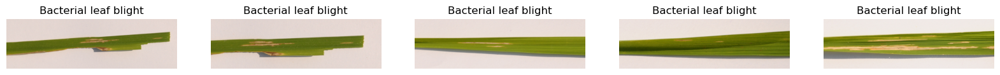

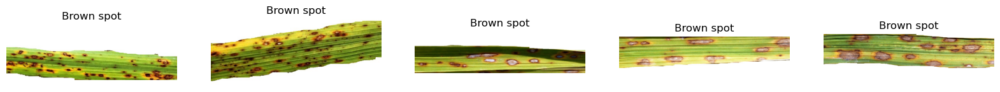

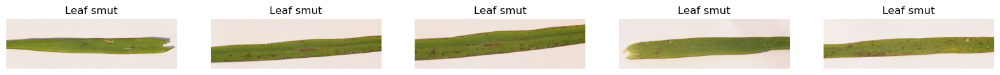

<Figure size 2000x1000 with 0 Axes>

In [39]:
import matplotlib.pyplot as plt
import os
from PIL import Image
data_dir = "C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data"
def show_sample_images(data_dir, num_images=5):
    for class_dir in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_dir)
        if os.path.isdir(class_path):
            plt.figure(figsize=(20, 10))
            for i, image_file in enumerate(os.listdir(class_path)[:num_images]):
                img = Image.open(os.path.join(class_path, image_file))
                plt.subplot(1, num_images, i + 1)
                plt.imshow(img)
                plt.title(class_dir)
                plt.axis('off')
            plt.show()
show_sample_images(data_dir)

In the photo above, the length and height of the leaves are not the same, which hindered us in understanding their appearance. But we are getting diagnosis and proper symptoms of the disease.

# Basic Operations 

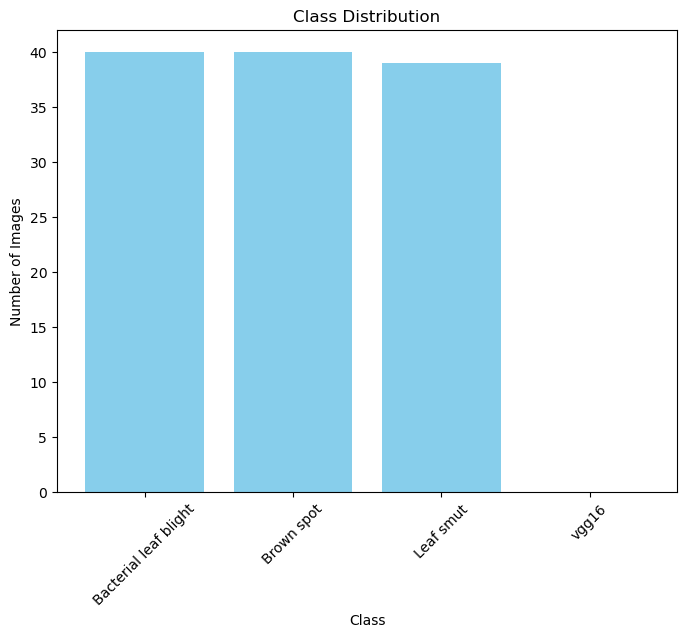

In [42]:
import matplotlib.pyplot as plt
import os
data_dir = "C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data" 
def plot_class_distribution(data_dir):
    class_counts = {}
    for class_dir in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_dir)
        if os.path.isdir(class_path):
            class_counts[class_dir] = len(os.listdir(class_path))
    plt.figure(figsize=(8, 6))
    plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.title('Class Distribution')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()
plot_class_distribution(data_dir)

The Bacterial leaf blight and Brown spot have same indentity and sympomts.

The Leaf smut data have 39 sympotoms have the same data but less amount.







Leaf smut has less tendency in bacteria format

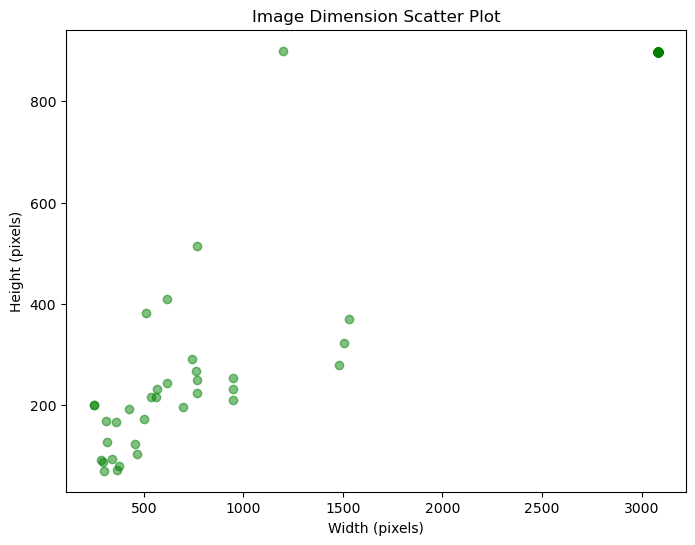

In [43]:
def plot_image_size_scatter(data_dir):
    widths = []
    heights = []
    for class_dir in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_dir)
        if os.path.isdir(class_path):
            for image_file in os.listdir(class_path):
                img = Image.open(os.path.join(class_path, image_file))
                widths.append(img.size[0])
                heights.append(img.size[1])
    plt.figure(figsize=(8, 6))
    plt.scatter(widths, heights, alpha=0.5, color='green')
    plt.title('Image Dimension Scatter Plot')
    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.show()
plot_image_size_scatter(data_dir)

The total leaf height was found in 890 pixels.

And the medium height was and varient is 250.

Maximum width of leaf is betwwen 550 and 600.  The most probident data that found multiple data has 500 to 1200.

In [45]:
import pathlib
data_dir=pathlib.Path(data_dir)
data_dir

WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data')

In [1]:
# that we are generated because for remember to the current working directory. 

In [46]:
list(data_dir.glob("*DSC*.jpg"))

[]

In [47]:
bacteria=list(data_dir.glob("Bacterial leaf blight/*"))
len(bacteria)

40

In [48]:
x = list(data_dir.glob("Bacterial leaf blight/DSC_0379.JPG"))
len(x)

1

In [49]:
import PIL

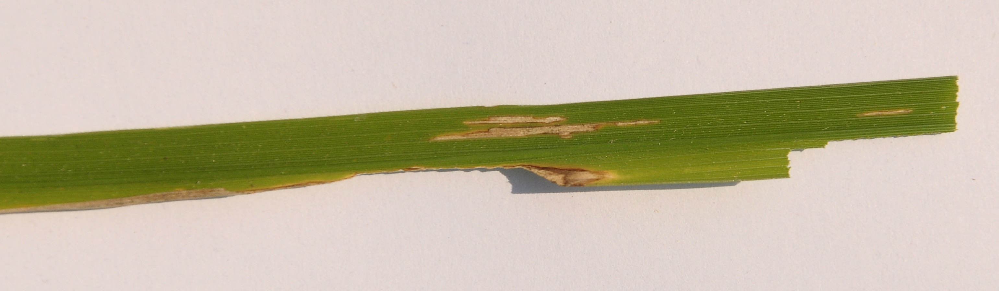

In [50]:
PIL.Image.open(str(bacteria[0]))

The said leaf seen in the picture is half worn. Also, there is some damage on the right side. There is a small space in the middle of the page where we can see the broken parts. In this we can fully see it but cannot diagnose it.


If we want to diagnose this leaf, we need to look at the outside of the leaf to see how much damage it has. We can see it in the next image.

In [51]:
brown=list(data_dir.glob("Brown spot/*"))
len(brown)

40

# Contains all the images of a specific directory to the key name of the directory

In [52]:
dict={"bacteria":list(data_dir.glob("Bacterial leaf blight/*")),"brown":list(data_dir.glob("Brown spot/*")),"smut":list(data_dir.glob("Leaf smut/*"))}

In [53]:
dict

{'bacteria': [WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0365.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0366.jpg'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0367.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0370.jpg'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0372.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0373.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0374.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0375.JPG'),
  WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight/DSC_0

##### Locating images in working directory. 

In [54]:
labels_dict = {
    'bacteria': 0,
    'brown': 1,
    'smut': 2,  
}

In [55]:
str(dict["smut"][0])

'C:\\Users\\thomb\\Desktop\\INTERNSHIP\\PRCP-1001-RiceLeaf\\Data\\Leaf smut\\DSC_0293.JPG'

In [56]:
labels_dict["smut"]

2

Data(Image) are found in "SMUT" category are two damages. That means the minimum quality images are smut data

The SMUT category has only 2 ways to indicate that leaf has some types of disease.

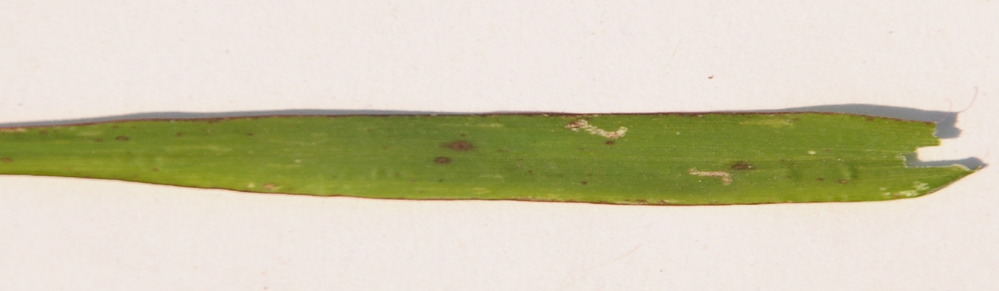

In [57]:
PIL.Image.open(str(dict["smut"][0]))

Most important factor is the red dots are found in only middle sides. Not found in up and down format

In this image you can see many dark colored spots in the center of the leaf.  Also we can see from this the diagnosis of the leaf and the disease on it.

In [59]:
print(f'The No of Sub-directories {len(os.listdir(train))} ')
print()
images = 0
for dir in os.listdir(train):
    subdir_path = os.path.join(train, dir)
    if os.path.isdir(subdir_path):
        num_files = len(os.listdir(subdir_path))
        print(f'The No of Images inside the Sub-directory {dir}: {num_files}')
        images += num_files 
print()
print(f'Totol No of Images {images}')

The No of Sub-directories 4 

The No of Images inside the Sub-directory Bacterial leaf blight: 40
The No of Images inside the Sub-directory Brown spot: 40
The No of Images inside the Sub-directory Leaf smut: 39
The No of Images inside the Sub-directory vgg16: 0

Totol No of Images 119


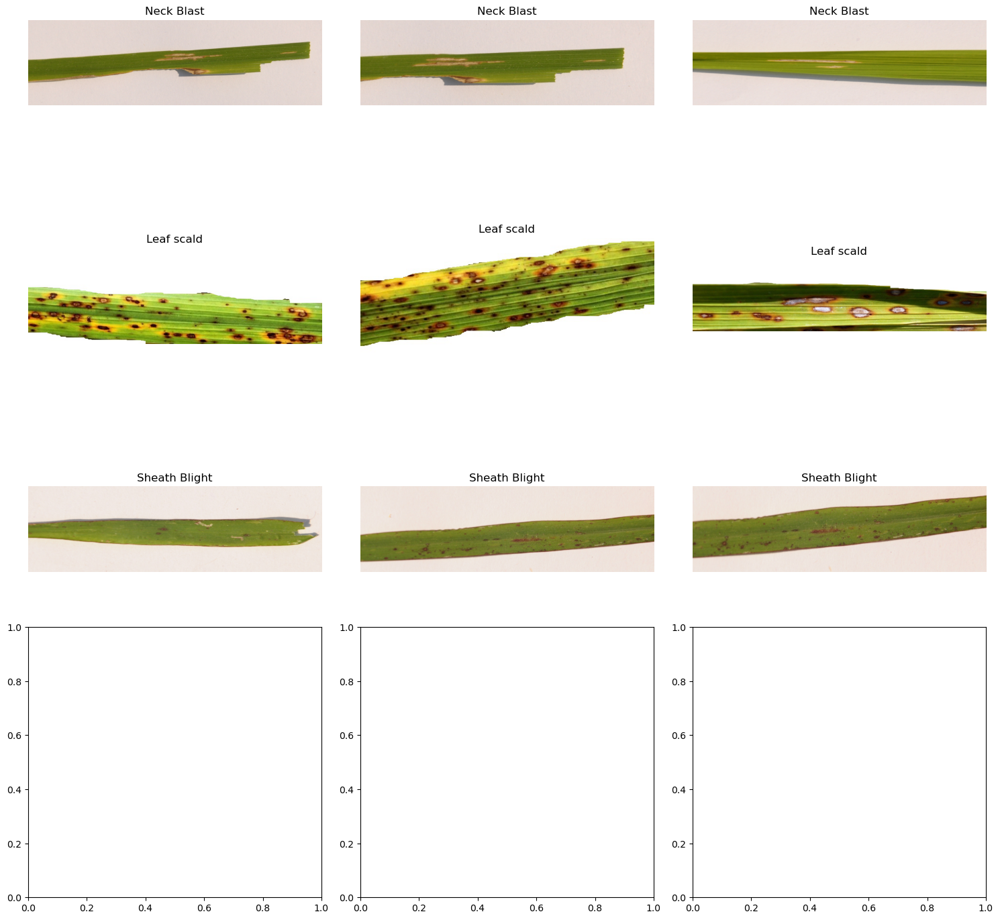

In [60]:
fig, axs = plt.subplots(nrows=len(os.listdir(train)), ncols=3, figsize=(15, 15))
for i, subfolder in enumerate(os.listdir(train)):
    subfolder_path = os.path.join(train, subfolder)
    image_filenames = os.listdir(subfolder_path)[:3]
    for j, filename in enumerate(image_filenames):
        if j >= 3:
            break 
        image_path = os.path.join(subfolder_path, filename)
        image = plt.imread(image_path)
        axs[i, j].imshow(image)
        axs[i, j].axis('off')
        if i == 0:
            axs[i,j].set_title('Neck Blast')
        if i == 1 :
            axs[i,j].set_title('Leaf scald')
        if i == 2:
            axs[i,j].set_title('Sheath Blight')
        if i == 3 :
            axs[i,j].set_title('Healthy Rice Leaf')
        if i == 4:
            axs[i,j].set_title('Narrow Brown Leaf Spot')
        if i == 5 :
            axs[i,j].set_title('Leaf Blast')
        if i == 6 :
            axs[i,j].set_title('Rice Hispa')
        if i == 7:
            axs[i,j].set_title('Brown Spot')
        if i == 8 :
            axs[i,j].set_title('Bacterial Leaf Blight')
plt.tight_layout()
plt.show()

In this plot we can see all the leaves and their diseases. Also we have tried to highlight the dark spots on them. It is mentioned in two different parts.

1. In the images of the first line, we can see only brown color but vertical type stripes. 
Also, the height and color of the leaves are the same. So we have called this category as neck blast.

2. In the images of the second line, we have seen dark spots. Also in this we have same height, color and thickness of these leaves. Also, the color of these leaves is more green and pale than other leaf colors.  So we have called it as Leaf Scald.

3. In the plot of the third images we saw a bit darker leaf color and in the hi also we saw dark spots but these spots were smaller and more in size than the other spots. Also, these spots appeared more on the outer side of the leaves, so we diagnosed it as Sheath Blight.

Since the data is zero in plot number four, no images are shown here.

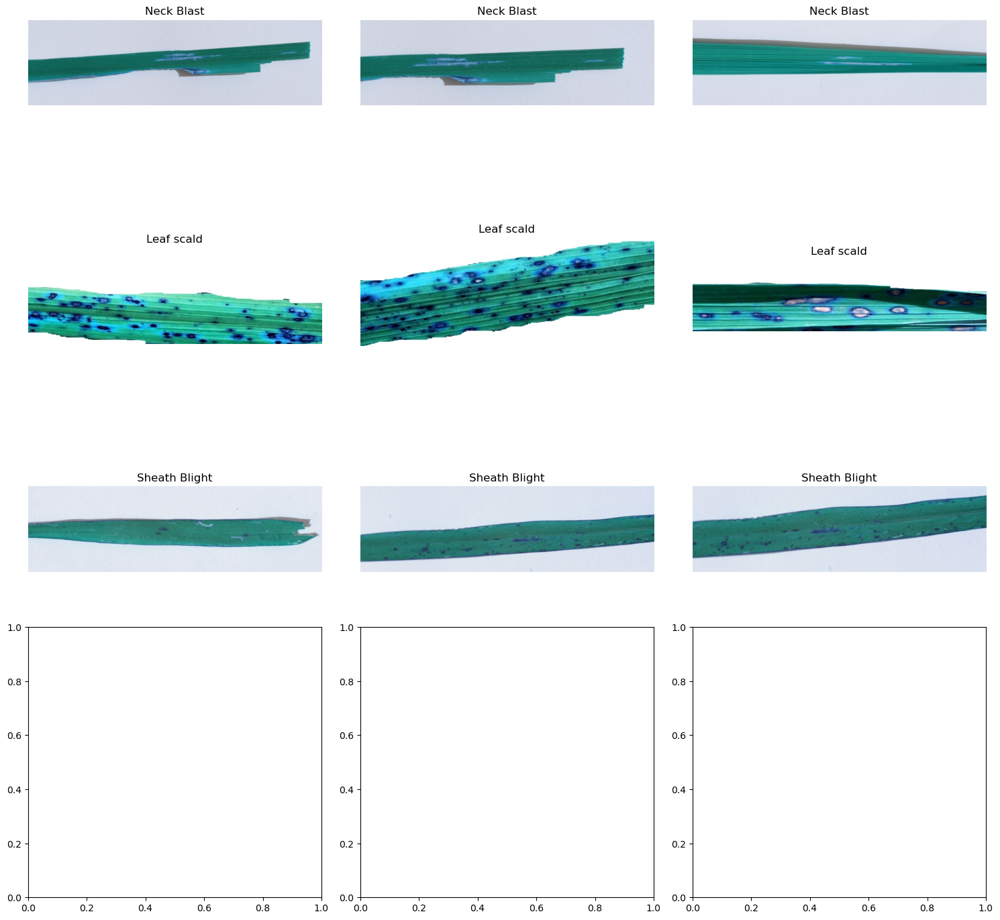

In [61]:
import cv2 as cv
fig, axs = plt.subplots(nrows=len(os.listdir(train)), ncols=3, figsize=(15, 15))
for i, subfolder in enumerate(os.listdir(train)):
    subfolder_path = os.path.join(train, subfolder)
    image_filenames = os.listdir(subfolder_path)[:3]
    for j, filename in enumerate(image_filenames):
        if j >= 3:
            break 
        image_path = os.path.join(subfolder_path, filename)
        image = cv.imread(image_path)
        axs[i, j].imshow(image)
        axs[i, j].axis('off')
        if i == 0:
            axs[i,j].set_title('Neck Blast')
        if i == 1 :
            axs[i,j].set_title('Leaf scald')
        if i == 2:
            axs[i,j].set_title('Sheath Blight')
        if i == 3 :
            axs[i,j].set_title('Healthy Rice Leaf')
        if i == 4:
            axs[i,j].set_title('Narrow Brown Leaf Spot')
        if i == 5 :
            axs[i,j].set_title('Leaf Blast')
        if i == 6 :
            axs[i,j].set_title('Rice Hispa')
        if i == 7:
            axs[i,j].set_title('Brown Spot')
        if i == 8 :
            axs[i,j].set_title('Bacterial Leaf Blight')
plt.tight_layout()
plt.show()

Detected suspicious disease using blue highlinght

When we're read an image using OpenCV, it inherently applies certain operations that can help highlight important regions compared to a raw, unprocessed image.

Also in this plot we have added blue color layer on all the images so that we can see its spots clearly.

In [62]:
print(f'The No of Sub-directories {len(os.listdir(train))} ')
print()
images = 0
for dir in os.listdir(train):
    subdir_path = os.path.join(train, dir)
    if os.path.isdir(subdir_path):
        num_files = len(os.listdir(subdir_path))
        print(f'The No of Images inside the Sub-directory {dir}: {num_files}')
        images += num_files 
print()
print(f'Totol No of Images {images}')

The No of Sub-directories 4 

The No of Images inside the Sub-directory Bacterial leaf blight: 40
The No of Images inside the Sub-directory Brown spot: 40
The No of Images inside the Sub-directory Leaf smut: 39
The No of Images inside the Sub-directory vgg16: 0

Totol No of Images 119


In [63]:
print(f'The No of Sub-directories {len(os.listdir(train))} ')
print()
images_train_aug = 0
for dir in os.listdir(train):
    subdir_path = os.path.join(train, dir)
    
    if os.path.isdir(subdir_path):
        num_files = len(os.listdir(subdir_path))
        print(f'The No of Images percentage inside the Sub-directory {dir}: {(num_files / images) * 100 }')
        images_train_aug += num_files 
print()
print(f'Totol No of Images {images_train_aug}')

The No of Sub-directories 4 

The No of Images percentage inside the Sub-directory Bacterial leaf blight: 33.61344537815126
The No of Images percentage inside the Sub-directory Brown spot: 33.61344537815126
The No of Images percentage inside the Sub-directory Leaf smut: 32.773109243697476
The No of Images percentage inside the Sub-directory vgg16: 0.0

Totol No of Images 119


The No of Sub-directories 4 

The No of Images percentage inside the Sub-directory Bacterial leaf blight: 33.61344537815126
The No of Images percentage inside the Sub-directory Brown spot: 33.61344537815126
The No of Images percentage inside the Sub-directory Leaf smut: 32.773109243697476
The No of Images percentage inside the Sub-directory vgg16: 0.0

Total No of Images 119



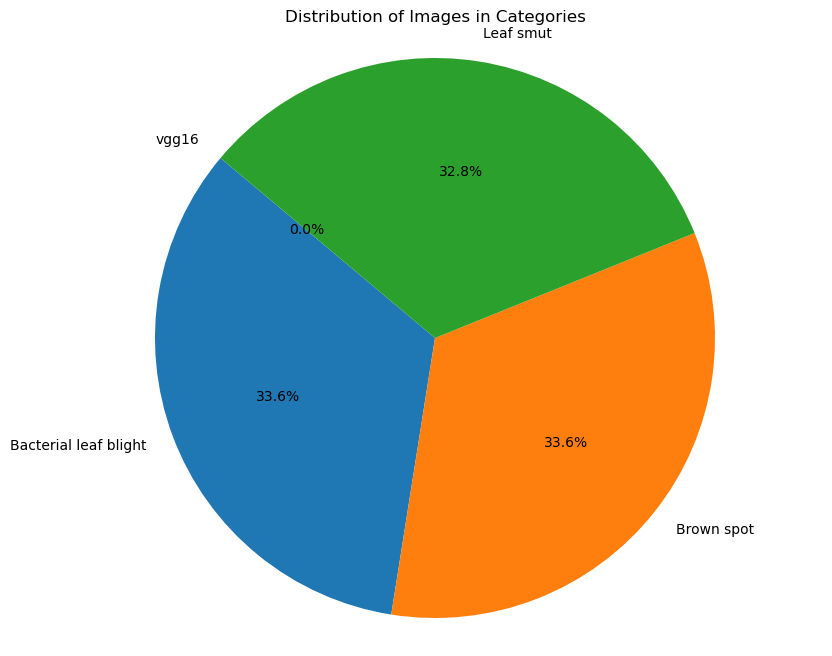

In [64]:
print(f'The No of Sub-directories {len(os.listdir(train))} ')
print()
images = 0
categories = []
percentages = []
for dir in os.listdir(train):
    subdir_path = os.path.join(train, dir)
    if os.path.isdir(subdir_path):
        num_files = len(os.listdir(subdir_path))
        category_name = dir.replace('_', ' ')  
        categories.append(category_name)
        percentages.append((num_files / 11790) * 100)
        print(f'The No of Images percentage inside the Sub-directory {dir}: {(num_files / images_train_aug) * 100 }')
        images += num_files 
print()
print(f'Total No of Images {images}')
plt.figure(figsize=(10, 8))
plt.pie(percentages, labels=categories, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  
plt.title('Distribution of Images in Categories')
print()
plt.show()

In the graphs we can see what percentage of the disease is in the given data.

1. Bacterial leaf blight have 33.6%
2. Leaf smut is 32.8%
3. Brown spot have 33.6%

In [66]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [67]:
base_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' 
categories = os.listdir(base_dir)
categories = [cat for cat in categories if os.path.isdir(os.path.join(base_dir, cat))]

In [68]:
image_count = {}
for category in categories:
    category_path = os.path.join(base_dir, category)
    image_count[category] = len(os.listdir(category_path))
print(image_count)

{'Bacterial leaf blight': 40, 'Brown spot': 40, 'Leaf smut': 39, 'vgg16': 0}


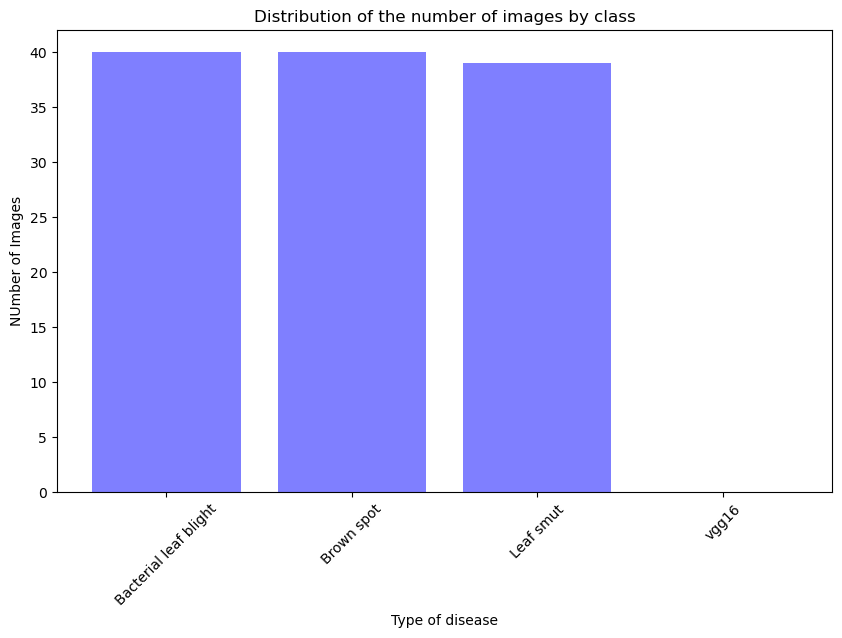

In [69]:
classes = list(image_count.keys())
counts = list(image_count.values())
plt.figure(figsize=(10, 6))
plt.bar(classes, counts, color='b', alpha=0.5)
plt.title('Distribution of the number of images by class')
plt.xlabel('Type of disease')
plt.ylabel('NUmber of Images')
plt.xticks(rotation=45) 
plt.show()

The same data has show in above graphs

In [2]:
class Dataset:
    def __init__(self, data_root: str, *, test_size: float, img_size: int, seed: int = 0) -> None:
        self.label2index = {}
        self.index2label = {}       
        # Discover the class label names.
        class_labels = os.listdir(data_root)
        self.nclasses = len(class_labels)
        X, y = [], []
        for label_index, label in enumerate(class_labels):
            # Load the images for this class label.
            self.label2index[label_index] = label
            self.index2label[label] = label_index
            
            img_names = os.listdir(os.path.join(data_root, label))
            for img_name in img_names:
                img_path = os.path.join(data_root, label, img_name)
                img = load_img(img_path, target_size=(img_size, img_size, 3))
                X.append(img_to_array(img))
                y.append(label_index)
        
        X = np.array(X)
        y = np.array(y)
        one_hot_y = to_categorical(y, num_classes=self.nclasses)
        
        # Make a stratified split.
        self.X, self.X_test, self.labels, self.labels_test, self.y, self.y_test = train_test_split(
            X, y, one_hot_y, test_size=test_size, random_state=seed, stratify=y
        )

        
data = Dataset("C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data", test_size=0.3, img_size=256)
print(data.X.shape, data.y.shape)

(83, 256, 256, 3) (83, 3)


Found the data in multi varient showcase. 

In [6]:
# Sorting the path of data into veriable
train_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data'  #Location of training images
validation_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' # Location of test images
test_dir ='C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' # Location of test images

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [11]:
# Generating batches of image data
train_datagen = ImageDataGenerator(
    rescale= (1./255),
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=(1./255))
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(180,180),
    batch_size=16,
    color_mode='rgb',
    class_mode='categorical')
val_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(180,180),
    batch_size=16,
    color_mode='rgb',
    class_mode='categorical')

Found 119 images belonging to 3 classes.
Found 119 images belonging to 3 classes.


In [12]:
import splitfolders
splitfolders.ratio(r"C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data", output="output", seed=1337, ratio=(.8, 0.1,0.1))

Copying files: 119 files [00:00, 942.16 files/s]


In [13]:
# Sorting the path of data into veriable
train_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data'  #Location of training images
validation_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' # Location of test images
test_dir ='C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' # Location of test images

In [14]:
# Generating batches of image data
train_datagen = ImageDataGenerator(
    rescale= (1./255),
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=(1./255))
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(180,180),
    batch_size=16,
    color_mode='rgb',
    class_mode='categorical')
val_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=(180,180),
    batch_size=16,
    color_mode='rgb',
    class_mode='categorical')

Found 119 images belonging to 3 classes.
Found 119 images belonging to 3 classes.


In [15]:
# plotting train images with their labels
def plots(ims, figsize=(20,25), rows=4, interp = False, title = None):
    f = plt.figure(figsize=figsize)
    cols = len(ims) // rows if len(ims) % 2 ==0 else len(ims) // rows+1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('off')
        sp.set_title(class_names[title[i].tolist().index(1)],fontsize=16)
        plt.imshow(ims[i])
class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

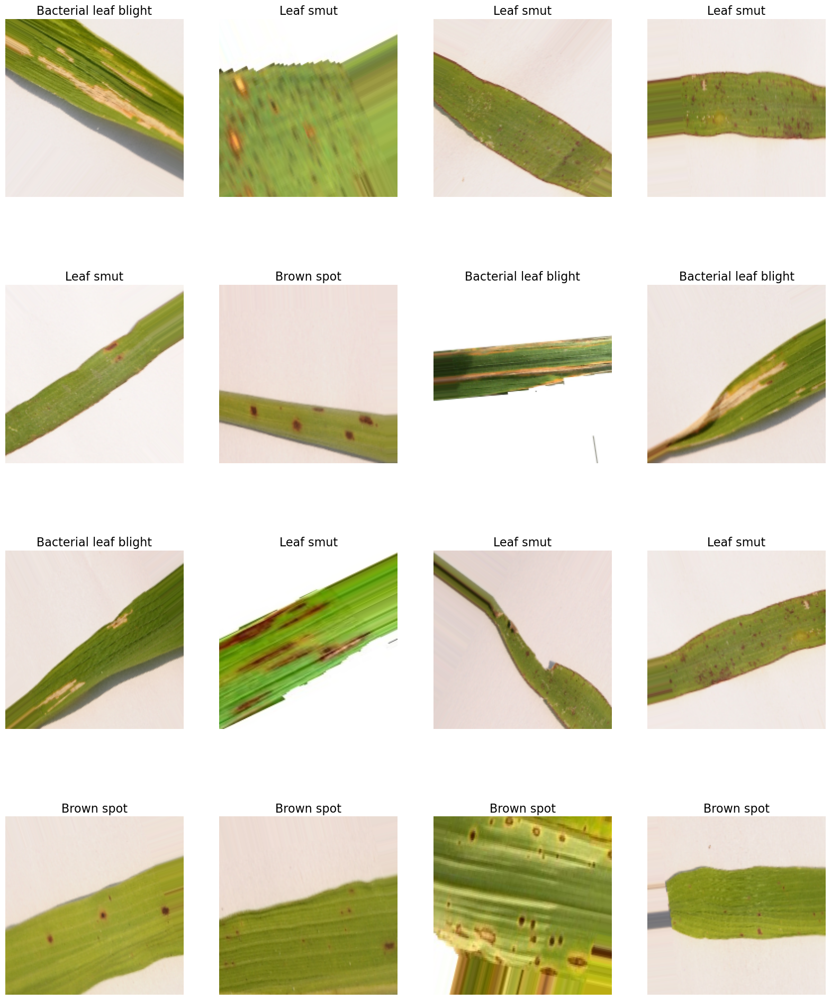

In [16]:
imgs, labels = next(train_generator)
plots(imgs, title = labels)

## CNN Model 

In [18]:
from keras.layers import LSTM  
from keras import models, layers
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3,3), activation='relu',input_shape=(180,180,3)))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(filters=64,kernel_size=(3,3),activation= 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(filters=128,kernel_size=(3,3),activation= 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(filters=256,kernel_size=(3,3),activation= 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(3, activation ='softmax'))

C:\Users\thomb\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [24]:
import keras
import pydotplus
from keras.utils import plot_model
from tensorflow.keras.utils import plot_model

In [25]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 18, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 20736)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 3)                   │          62,211 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 450,627 (1.72 MB)

 Trainable params: 450,627 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
model = tf.keras.models.load_model("model.h5")
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 18, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 20736)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 3)                   │          62,211 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 450,629 (1.72 MB)

 Trainable params: 450,627 (1.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [35]:
test_datagen = ImageDataGenerator(rescale=(1./255))
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(180,180),
    batch_size=16,
    color_mode='rgb',
    class_mode='categorical')

Found 119 images belonging to 3 classes.


In [36]:
model.evaluate(test_generator)

8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 576ms/step - accuracy: 0.6038 - loss: 0.8776


[0.9145803451538086, 0.5462185144424438]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


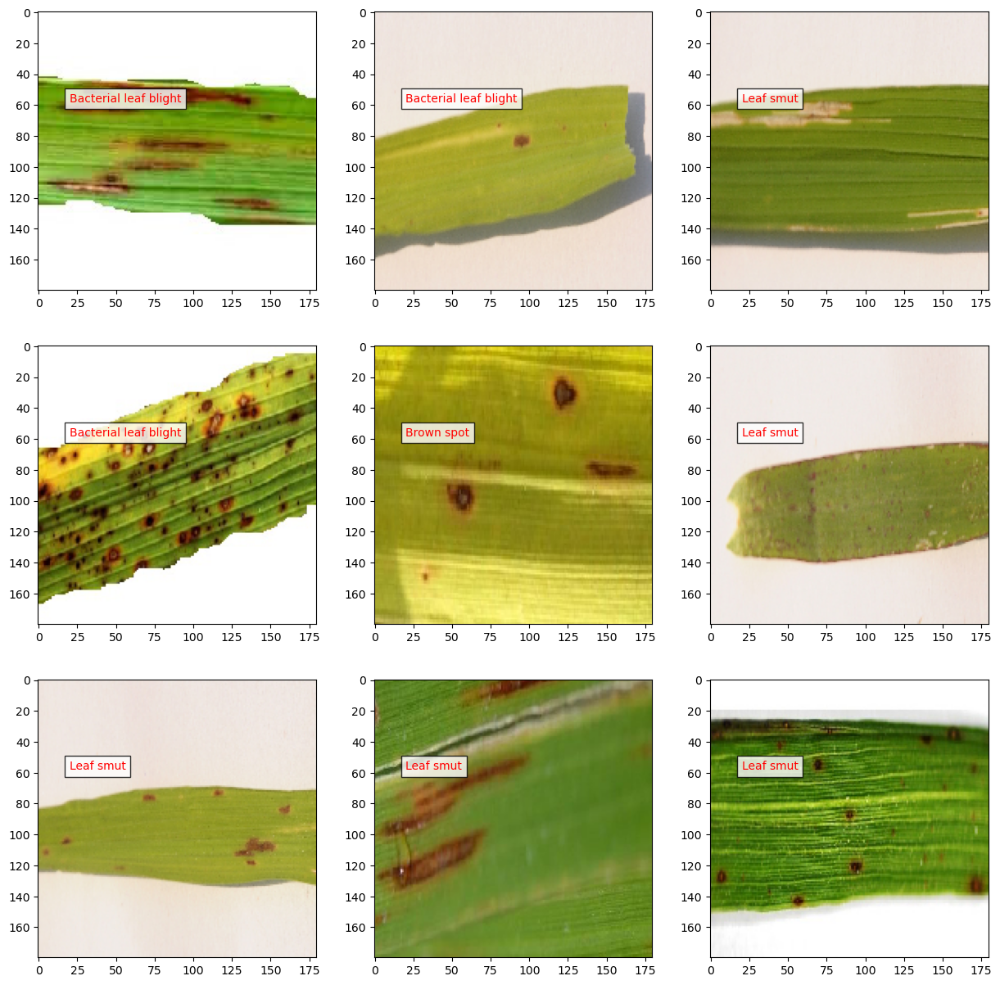

In [37]:
# Visualise the prediction of the model
imgs, labels = next(test_generator)
fig =plt.figure(figsize=(15,15))
columns = 3
rows = 3
for i in range(columns*rows):
    fig.add_subplot(rows, columns, i+1)
    img_t = np.expand_dims(imgs[i],axis=0)
    prediction = model.predict(img_t)
    idx = prediction[0].tolist().index(max(prediction[0]))
    plt.text(20,58, class_names[idx],color='red',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.imshow(imgs[i])

In this cell, we have accurately diagnosed the disease on the leaves and displayed it in the form of TEXT.

Also the system indicated to you where dark spot and disease appeared.

In [59]:
from PIL import Image
import seaborn as sns
import pandas as pd
import random
import joblib
from tqdm import tqdm
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from concurrent.futures import ThreadPoolExecutor

#### We importing multiple time ML Libraries bacause our version did not support latest repositories. 

In [55]:
base_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' 
categories = os.listdir(base_dir)
categories = [cat for cat in categories if os.path.isdir(os.path.join(base_dir, cat))]

In [56]:
image_count = {}
for category in categories:
    category_path = os.path.join(base_dir, category)
    image_count[category] = len(os.listdir(category_path))
print(image_count)

{'Bacterial leaf blight': 40, 'Brown spot': 40, 'Leaf smut': 39}


In [60]:
image_sizes = []
for category in categories:
    category_path = os.path.join(base_dir, category)
    for image_name in os.listdir(category_path):
        image_path = os.path.join(category_path, image_name)
        with Image.open(image_path) as img:
            image_sizes.append(img.size)
image_sizes = np.array(image_sizes)
average_size = image_sizes.mean(axis=0)
print(f"The average size of the image.: {average_size}")

The average size of the image.: [2383.63865546  707.7394958 ]


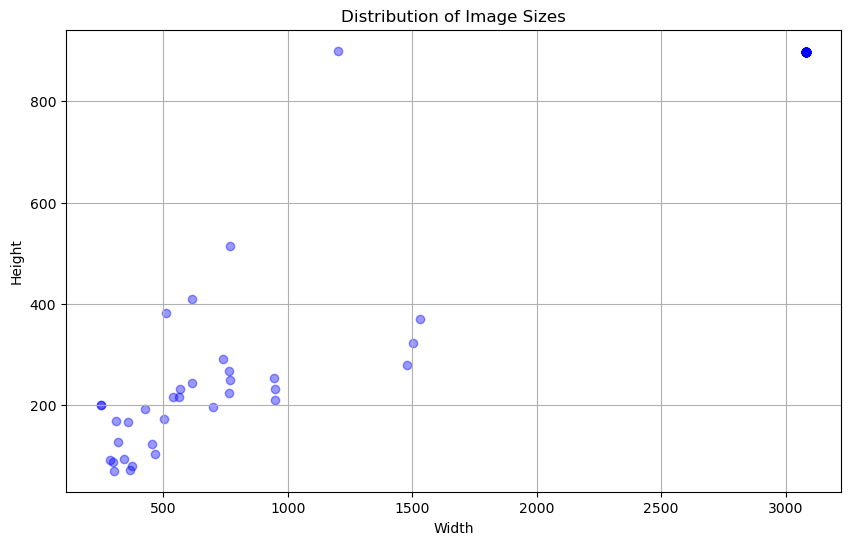

In [61]:
plt.figure(figsize=(10, 6))
# Scatter plot of image sizes, with width on the x-axis and height on the y-axis
plt.scatter(image_sizes[:, 0], image_sizes[:, 1], alpha=0.4, color='b')
plt.title('Distribution of Image Sizes')  # Title in English
plt.xlabel('Width')  # X-axis label
plt.ylabel('Height')  # Y-axis label
plt.grid(True)
plt.show()

In [62]:
def display_class_images(class_folder_path, class_name=''):
    image_files = os.listdir(class_folder_path)
    num_images_to_display = min(len(image_files), 25)
    fig, axes = plt.subplots(5, 5, figsize=(7, 7))
    fig.suptitle(f"Class: {class_name}")
    for i in range(num_images_to_display):
        row = i // 5
        col = i % 5
        image_path = os.path.join(class_folder_path, image_files[i])
        image = plt.imread(image_path)
        axes[row, col].imshow(image)
        axes[row, col].axis('off')       
    plt.show()

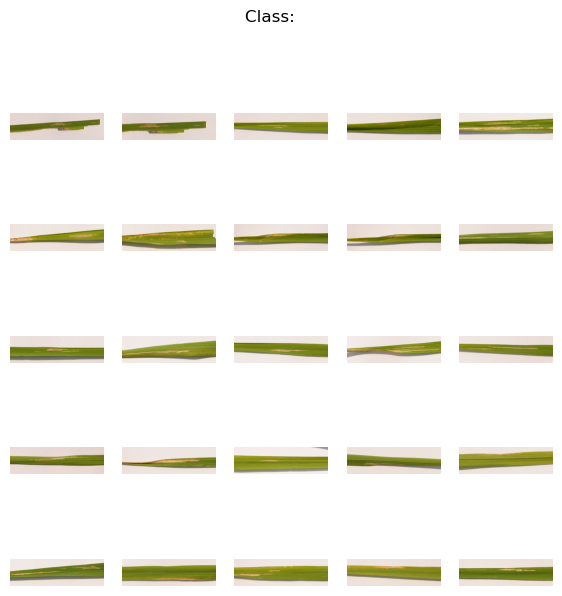

In [65]:
display_class_images("C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Bacterial leaf blight")

#### Indicating SMUT varient disease. 

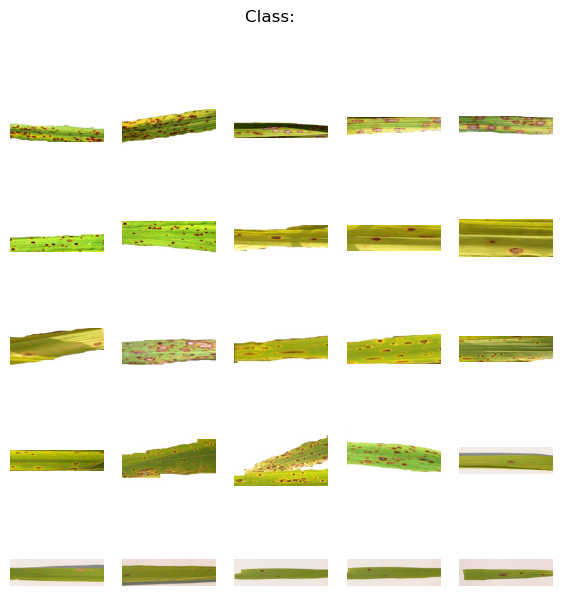

In [66]:
display_class_images("C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Brown spot")

#### Indicating brown spots

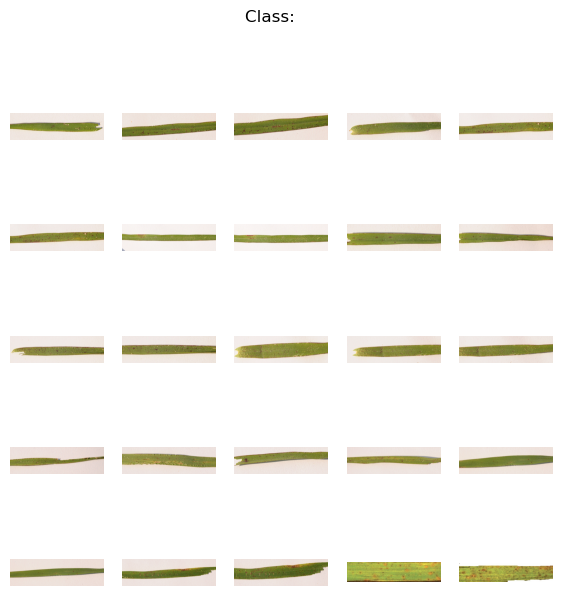

In [67]:
display_class_images("C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data/Leaf smut")

#### Detected the longiting images.

# Augmentation and splitting the train/test set

In [68]:
main_path = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data'
data = []
for label in os.listdir(main_path):
    for file in os.listdir(os.path.join(main_path, label)):
        data.append([os.path.join(main_path, label, file), label])
# Convert to a DataFrame
df = pd.DataFrame(data, columns=['filepath', 'label'])
# Split into train and test sets
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

In [70]:
import cv2
def get_data(dataframe):
    images = []
    labels = []
    for _, row in dataframe.iterrows():
        image_path = row['filepath']
        label = row['label']
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        images.append(img)
        labels.append(label)
    images = np.array(images, dtype='float32')
    labels = np.array(labels)
    return images, labels
# Load and preprocess train and test data
X_train, y_train = get_data(train_df)
X_test, y_test = get_data(test_df)

In [71]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)
for i, label in enumerate(label_encoder.classes_):
    print(f"Integer: {i} => Label: {label}")

Integer: 0 => Label: Bacterial leaf blight
Integer: 1 => Label: Brown spot
Integer: 2 => Label: Leaf smut


In [72]:
data_train = list(zip(X_train, y_train))

In [73]:
np.random.shuffle(data_train)
X_train, y_train = zip(*data_train)
X_train = np.array(X_train) / 255
X_test = np.array(X_test) / 255
X_train = X_train.reshape(X_train.shape[0], 128, 128, 3)
X_test = X_test.reshape(X_test.shape[0], 128, 128, 3)
y_train = np.array(y_train)
y_test = np.array(y_test)
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
X_train = (X_train * 255).astype(np.uint8)
X_test = (X_test * 255).astype(np.uint8)
y_train = y_train.astype(np.int32)
y_test = y_test.astype(np.int32)

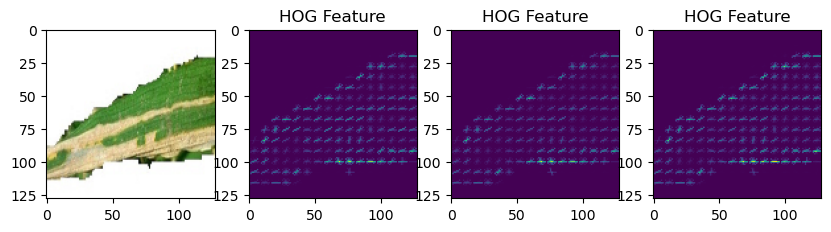

In [74]:
hog_features = []
fd_features = []
for i in range(3):
    fd, hog_image = hog(X_train[0][:, :, i], orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True,
                                        block_norm='L2-Hys', transform_sqrt=True, feature_vector=True)
    hog_features.append(hog_image)
    fd_features.append(fd)
plt.figure(figsize=(10, 5))
plt.subplot(1, 4, 1)
plt.imshow(X_train[0])
for i in range(3):
    plt.subplot(1, 4, i+2)
    plt.imshow(hog_features[i])
    plt.title('HOG Feature')
plt.show()

HOG Feature has been applied to this cell and its effects can be seen in this. In this we can see the complete diagnostics done on the pages.

In [75]:
np.array(fd_features).shape

(3, 8100)

In [76]:
np.hstack(fd_features).shape

(24300,)

In [77]:
def extract_hog_features(imgs):
    num_channels = 3  

    hog_features = []  
    for img in tqdm(imgs, desc="Extracting HOG features"):
        channel_hog_features = []          
        for i in range(num_channels):
            fd, hog_image = hog(img[:, :, i], orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2),
                                visualize=True, transform_sqrt=True, block_norm='L2-Hys')
            channel_hog_features.append(fd)
        concatenated_channel_hog = np.concatenate(channel_hog_features, axis=0)
        hog_features.append(concatenated_channel_hog)
    return np.array(hog_features)

In [78]:
x_train_hog = extract_hog_features(X_train)
x_test_hog = extract_hog_features(X_test)

Extracting HOG features: 100%|█████████████████████████████████████████████████████████| 24/24 [00:04<00:00,  4.91it/s]


In [79]:
x_train_hog.shape, x_test_hog.shape

((95, 24300), (24, 24300))

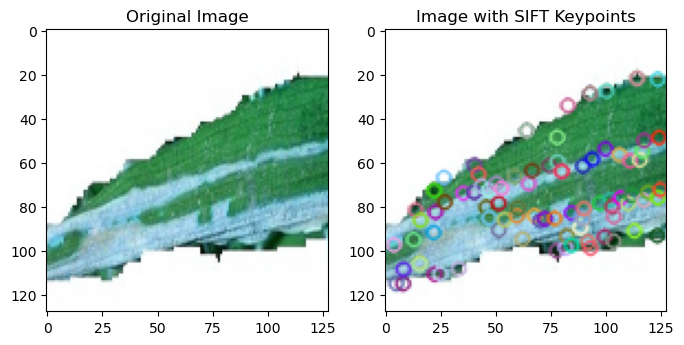

In [80]:
def extract_sift_features(images):
    sift = cv2.SIFT_create()
    sift_features = []
    for img in images:
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        kp, des = sift.detectAndCompute(gray_img, None)
        sift_features.append((kp, des))
    return sift_features
image = X_train[0]
sift_features = extract_sift_features([image])
kp_image = cv2.drawKeypoints(image, sift_features[0][0], None)
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(kp_image, cv2.COLOR_BGR2RGB))
plt.title('Image with SIFT Keypoints')
plt.show()

#### After applying the HOG feature we can see the full effect of the leaves. It is shown in a circle, so you can see exactly where the problem is found.

In [81]:
def extract_sift_features(images):
    sift_features = []
    for img in tqdm(images, desc="Extracting SIFT features"):
        sift = cv2.SIFT_create()   
        des_max = 128
        kp, des = sift.detectAndCompute(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), None)
        if des is None:
            des = np.zeros((1, des_max))
        elif len(des) < des_max:
            des = np.concatenate((des, np.zeros((des_max - len(des), 128))))
        else:
            des = des[:des_max]
        sift_features.append(des)  
    max_des_len = max(len(des) for des in sift_features)
    sift_features = [np.concatenate((des, np.zeros((max_des_len - len(des), 128)))) if len(des) < max_des_len else des for des in sift_features]    
    return np.array(sift_features)

In [82]:
x_train_sift = extract_sift_features(X_train)
x_test_sift = extract_sift_features(X_test)
x_train_sift = x_train_sift.reshape(x_train_sift.shape[0], -1)
x_test_sift = x_test_sift.reshape(x_test_sift.shape[0], -1)

Extracting SIFT features: 100%|███████████████████████████████████████████████████████| 24/24 [00:00<00:00, 189.09it/s]


In [83]:
x_train_sift.shape, x_test_sift.shape

((95, 16384), (24, 16384))

# Train Model

In [84]:
model_dir = 'models'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

In [85]:
def plot_confusion_matrix(cm, normalize=True, title='Confusion Matrix'):
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

## SVM 

SVM HOG - Accuracy: 70.83%
SVM HOG - F1_score: 71.00%
CPU times: total: 672 ms
Wall time: 384 ms


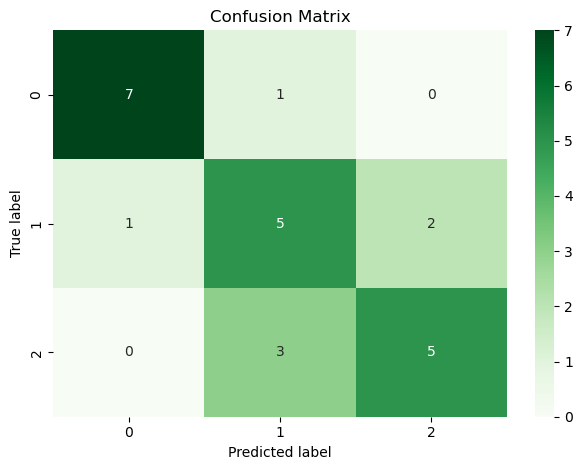

In [88]:
%%time
svm_hog = SVC(kernel='linear', C=1.0, random_state=0)
svm_hog.fit(x_train_hog, np.argmax(y_train, axis=1))
y_pred_svm_hog = svm_hog.predict(x_test_hog)
accuracy_score_svm_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_svm_hog)
f1_score_svm_hog = f1_score(np.argmax(y_test, axis=1), y_pred_svm_hog, average='macro')
print('SVM HOG - Accuracy: %.2f%%' % (accuracy_score_svm_hog*100))
print('SVM HOG - F1_score: %.2f%%' % (f1_score_svm_hog*100))
cm_svm_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_svm_hog)
plot_confusion_matrix(cm_svm_hog)

SVM SIFT - Accuracy: 58.33%
SVM SIFT - F1_score: 59.26%


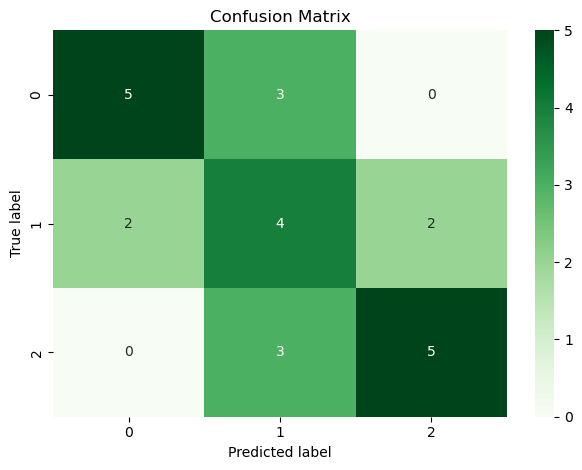

In [89]:
svm_sift = SVC(kernel='linear', C=1.0, random_state=0)
svm_sift.fit(x_train_sift, np.argmax(y_train, axis=1))
y_pred_svm_sift = svm_sift.predict(x_test_sift)
accuracy_score_svm_sift = accuracy_score(np.argmax(y_test, axis=1), y_pred_svm_sift)
f1_score_svm_sift = f1_score(np.argmax(y_test, axis=1), y_pred_svm_sift, average='macro')
print('SVM SIFT - Accuracy: %.2f%%' % (accuracy_score_svm_sift*100))
print('SVM SIFT - F1_score: %.2f%%' % (f1_score_svm_sift*100))
cm_svm_sift = confusion_matrix(np.argmax(y_test, axis=1), y_pred_svm_sift)
plot_confusion_matrix(cm_svm_sift)

RandomFores HOG - Accuracy: 75.00%
RandomFores HOG - F1_score: 74.24%


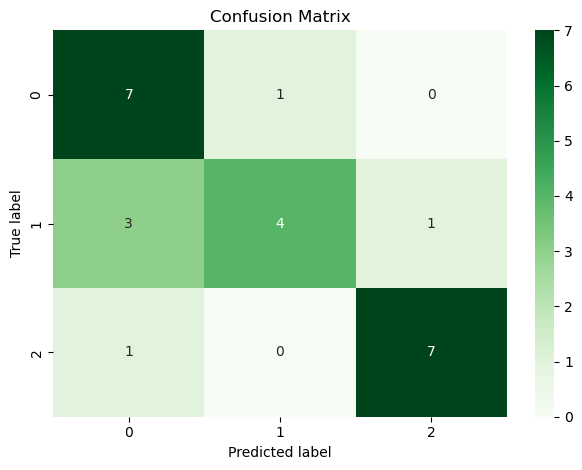

In [90]:
rf_hog = RandomForestClassifier(n_estimators=100, random_state=42)
rf_hog.fit(x_train_hog, np.argmax(y_train, axis=1))

y_pred_rf_hog = rf_hog.predict(x_test_hog)

accuracy_score_rf_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_rf_hog)
f1_score_rf_hog = f1_score(np.argmax(y_test, axis=1), y_pred_rf_hog, average='macro')

print('RandomFores HOG - Accuracy: %.2f%%' % (accuracy_score_rf_hog*100))
print('RandomFores HOG - F1_score: %.2f%%' % (f1_score_rf_hog*100))

cm_rf_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_rf_hog)
plot_confusion_matrix(cm_rf_hog)



RandomFores SIFT - Accuracy: 70.83%
RandomFores SIFT - F1_score: 70.44%


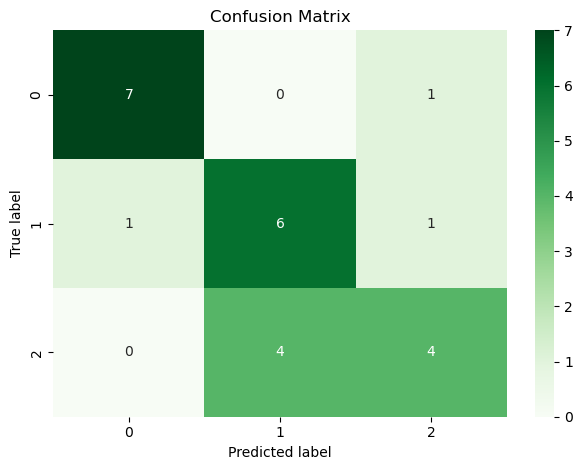

In [91]:
rf_sift = RandomForestClassifier(n_estimators=100, random_state=42)
rf_sift.fit(x_train_sift, np.argmax(y_train, axis=1))

y_pred_rf_sift = rf_sift.predict(x_test_sift)

accuracy_score_rf_sift = accuracy_score(np.argmax(y_test, axis=1), y_pred_rf_sift)
f1_score_rf_sift = f1_score(np.argmax(y_test, axis=1), y_pred_rf_sift, average='macro')

print('RandomFores SIFT - Accuracy: %.2f%%' % (accuracy_score_rf_sift*100))
print('RandomFores SIFT - F1_score: %.2f%%' % (f1_score_rf_sift*100))

cm_rf_sift = confusion_matrix(np.argmax(y_test, axis=1), y_pred_rf_sift)
plot_confusion_matrix(cm_rf_sift)

Decision Tree HOG - Accuracy: 62.50%
Decision Tree HOG - F1_score: 62.32%


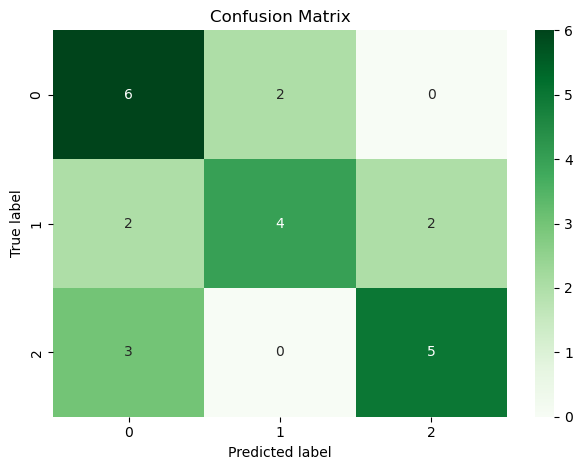

In [92]:
dt_hog = DecisionTreeClassifier(random_state=42)
dt_hog.fit(x_train_hog, np.argmax(y_train, axis=1))

y_pred_dt_hog = dt_hog.predict(x_test_hog)

accuracy_score_dt_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_dt_hog)
f1_score_dt_hog = f1_score(np.argmax(y_test, axis=1), y_pred_dt_hog, average='macro')

print('Decision Tree HOG - Accuracy: %.2f%%' % (accuracy_score_dt_hog * 100))
print('Decision Tree HOG - F1_score: %.2f%%' % (f1_score_dt_hog * 100))

cm_dt_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_dt_hog)
plot_confusion_matrix(cm_dt_hog)


Logistic Regression HOG - Accuracy: 70.83%
Logistic Regression HOG - F1_score: 70.23%


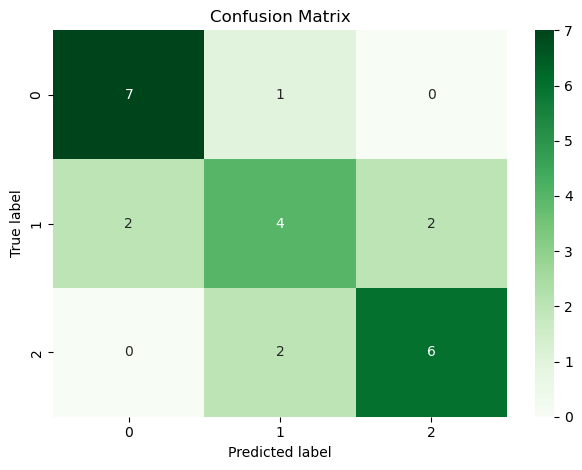

In [94]:
lr_hog = LogisticRegression(random_state=42)
lr_hog.fit(x_train_hog, np.argmax(y_train, axis=1))

y_pred_lr_hog = lr_hog.predict(x_test_hog)

accuracy_score_lr_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_lr_hog)
f1_score_lr_hog = f1_score(np.argmax(y_test, axis=1), y_pred_lr_hog, average='macro')

print('Logistic Regression HOG - Accuracy: %.2f%%' % (accuracy_score_lr_hog * 100))
print('Logistic Regression HOG - F1_score: %.2f%%' % (f1_score_lr_hog * 100))

cm_lr_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_lr_hog)
plot_confusion_matrix(cm_lr_hog)

Logistic Regression SIFT - Accuracy: 62.50%
Logistic Regression SIFT - F1_score: 63.19%


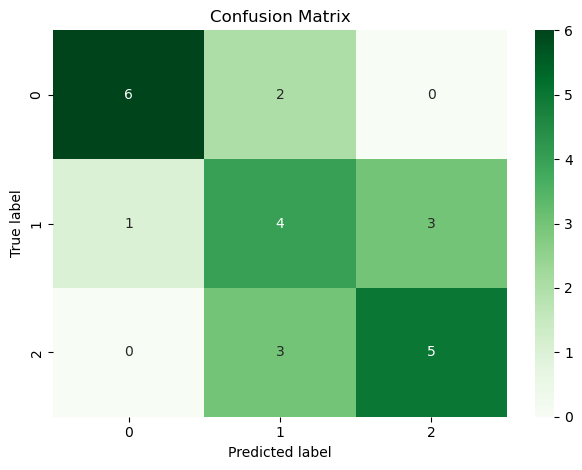

In [95]:
lr_sift = LogisticRegression(random_state=42)
lr_sift.fit(x_train_sift, np.argmax(y_train, axis=1))

y_pred_lr_sift = lr_sift.predict(x_test_sift)

accuracy_score_lr_sift = accuracy_score(np.argmax(y_test, axis=1), y_pred_lr_sift)
f1_score_lr_sift = f1_score(np.argmax(y_test, axis=1), y_pred_lr_sift, average='macro')

print('Logistic Regression SIFT - Accuracy: %.2f%%' % (accuracy_score_lr_sift * 100))
print('Logistic Regression SIFT - F1_score: %.2f%%' % (f1_score_lr_sift * 100))

cm_lr_sift = confusion_matrix(np.argmax(y_test, axis=1), y_pred_lr_sift)
plot_confusion_matrix(cm_lr_sift)

Naive Bayes HOG - Accuracy: 75.00%
Naive Bayes HOG - F1_score: 73.58%


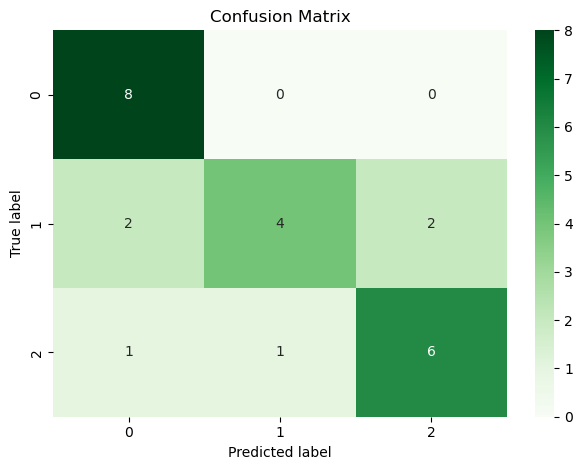

In [97]:
nb_hog = GaussianNB()
nb_hog.fit(x_train_hog, np.argmax(y_train, axis=1))

y_pred_nb_hog = nb_hog.predict(x_test_hog)

accuracy_score_nb_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_nb_hog)
f1_score_nb_hog = f1_score(np.argmax(y_test, axis=1), y_pred_nb_hog, average='macro')

print('Naive Bayes HOG - Accuracy: %.2f%%' % (accuracy_score_nb_hog * 100))
print('Naive Bayes HOG - F1_score: %.2f%%' % (f1_score_nb_hog * 100))

# Confusion Matrix
cm_nb_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_nb_hog)
plot_confusion_matrix(cm_nb_hog)

Naive Bayes SIFT - Accuracy: 62.50%
Naive Bayes SIFT - F1_score: 62.32%


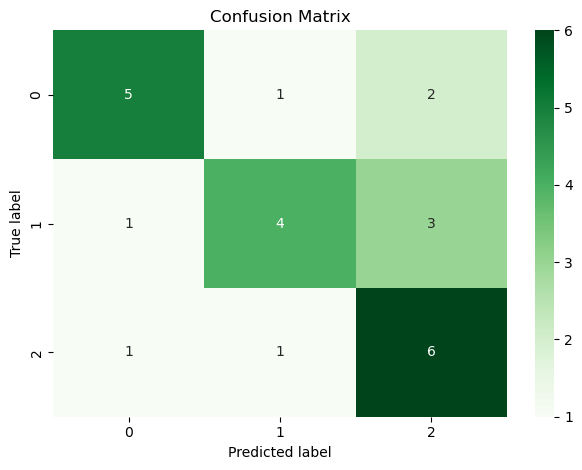

In [98]:
nb_sift = GaussianNB()
nb_sift.fit(x_train_sift, np.argmax(y_train, axis=1))

y_pred_nb_sift = nb_sift.predict(x_test_sift)

accuracy_score_nb_sift = accuracy_score(np.argmax(y_test, axis=1), y_pred_nb_sift)
f1_score_nb_sift = f1_score(np.argmax(y_test, axis=1), y_pred_nb_sift, average='macro')

print('Naive Bayes SIFT - Accuracy: %.2f%%' % (accuracy_score_nb_sift * 100))
print('Naive Bayes SIFT - F1_score: %.2f%%' % (f1_score_nb_sift * 100))

cm_nb_sift = confusion_matrix(np.argmax(y_test, axis=1), y_pred_nb_sift)
plot_confusion_matrix(cm_nb_sift)

MLP HOG - Accuracy: 66.67%
MLP HOG - F1_score: 64.84%


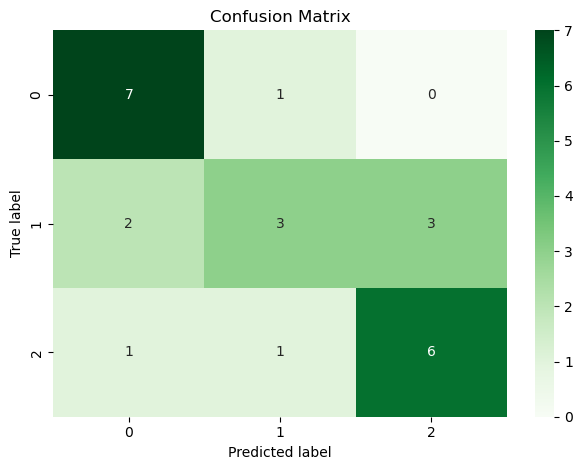

In [99]:
mlp_hog = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=0)
mlp_hog.fit(x_train_hog, np.argmax(y_train, axis=1))

y_pred_mlp_hog = mlp_hog.predict(x_test_hog)

accuracy_score_mlp_hog = accuracy_score(np.argmax(y_test, axis=1), y_pred_mlp_hog)
f1_score_mlp_hog = f1_score(np.argmax(y_test, axis=1), y_pred_mlp_hog, average='macro')

print('MLP HOG - Accuracy: %.2f%%' % (accuracy_score_mlp_hog * 100))
print('MLP HOG - F1_score: %.2f%%' % (f1_score_mlp_hog * 100))

cm_mlp_hog = confusion_matrix(np.argmax(y_test, axis=1), y_pred_mlp_hog)
plot_confusion_matrix(cm_mlp_hog)

MLP SIFT - Accuracy: 79.17%
MLP SIFT - F1_score: 78.59%


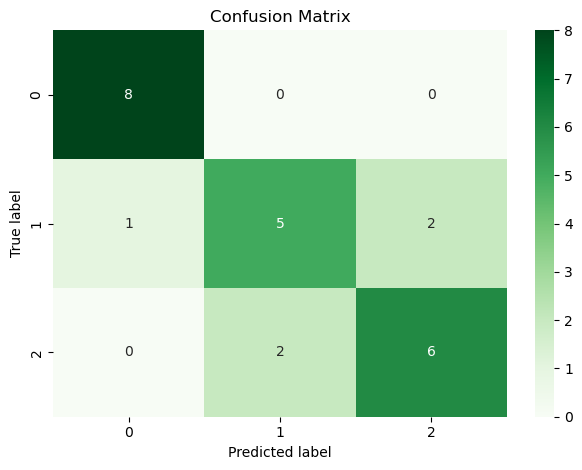

In [100]:
mlp_sift = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=0)
mlp_sift.fit(x_train_sift, np.argmax(y_train, axis=1))

y_pred_mlp_sift = mlp_sift.predict(x_test_sift)

accuracy_score_mlp_sift = accuracy_score(np.argmax(y_test, axis=1), y_pred_mlp_sift)
f1_score_mlp_sift = f1_score(np.argmax(y_test, axis=1), y_pred_mlp_sift, average='macro')

print('MLP SIFT - Accuracy: %.2f%%' % (accuracy_score_mlp_sift * 100))
print('MLP SIFT - F1_score: %.2f%%' % (f1_score_mlp_sift * 100))

cm_mlp_sift = confusion_matrix(np.argmax(y_test, axis=1), y_pred_mlp_sift)
plot_confusion_matrix(cm_mlp_sift)

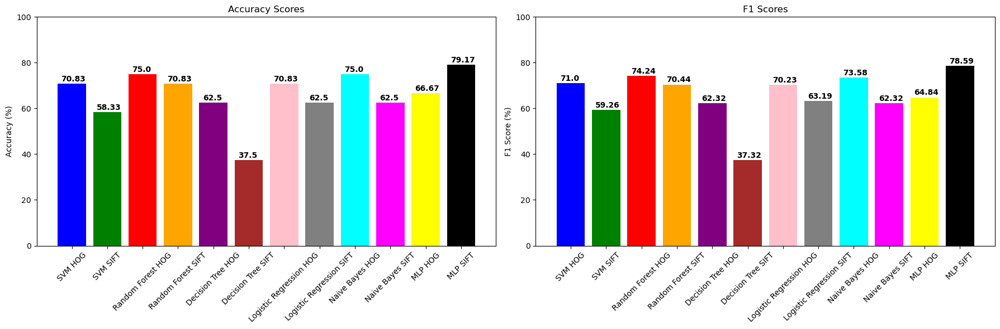

In [101]:
models = [
    'SVM HOG', 'SVM SIFT', 'Random Forest HOG', 'Random Forest SIFT', 
    'Decision Tree HOG', 'Decision Tree SIFT', 'Logistic Regression HOG', 
    'Logistic Regression SIFT', 'Naive Bayes HOG', 'Naive Bayes SIFT', 
    'MLP HOG', 'MLP SIFT'
]
accuracy_scores = [
    accuracy_score_svm_hog*100, accuracy_score_svm_sift*100, accuracy_score_rf_hog*100, 
    accuracy_score_rf_sift*100, accuracy_score_dt_hog*100, accuracy_score_dt_sift*100, 
    accuracy_score_lr_hog*100, accuracy_score_lr_sift*100, accuracy_score_nb_hog*100, 
    accuracy_score_nb_sift*100, accuracy_score_mlp_hog*100, accuracy_score_mlp_sift*100
]
f1_scores = [
    f1_score_svm_hog*100, f1_score_svm_sift*100, f1_score_rf_hog*100, 
    f1_score_rf_sift*100, f1_score_dt_hog*100, f1_score_dt_sift*100, 
    f1_score_lr_hog*100, f1_score_lr_sift*100, f1_score_nb_hog*100, 
    f1_score_nb_sift*100, f1_score_mlp_hog*100, f1_score_mlp_sift*100
]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

ax1.bar(models, accuracy_scores, color=[
    'blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'gray', 
    'cyan', 'magenta', 'yellow', 'black'
])
for i, v in enumerate(accuracy_scores):
    ax1.text(i - 0.3, v + 1, str(round(v, 2)), color='black', fontweight='bold')
ax1.set_title('Accuracy Scores')
ax1.set_ylabel('Accuracy (%)')
ax1.set_ylim(0, 100)
ax1.tick_params(axis='x', rotation=45, labelsize=10)

ax2.bar(models, f1_scores, color=[
    'blue', 'green', 'red', 'orange', 'purple', 'brown', 'pink', 'gray', 
    'cyan', 'magenta', 'yellow', 'black'
])
for i, v in enumerate(f1_scores):
    ax2.text(i - 0.3, v + 1, str(round(v, 2)), color='black', fontweight='bold')
ax2.set_title('F1 Scores')
ax2.set_ylabel('F1 Score (%)')
ax2.set_ylim(0, 100)
ax2.tick_params(axis='x', rotation=45, labelsize=10)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------------

In [104]:
import torch
import torchvision
import torchvision.transforms as TT
import torchvision.transforms.functional as TF
from torchvision.utils import make_grid
from collections import OrderedDict, defaultdict
from pathlib import Path

In [105]:
DATA_PATH = Path('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data')
# MODE = ['train', 'validation', 'test']
CLASSES = os.listdir(DATA_PATH)
IMG_SIZE = 224
DATA_PATH

WindowsPath('C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data')

Number of classes: 3


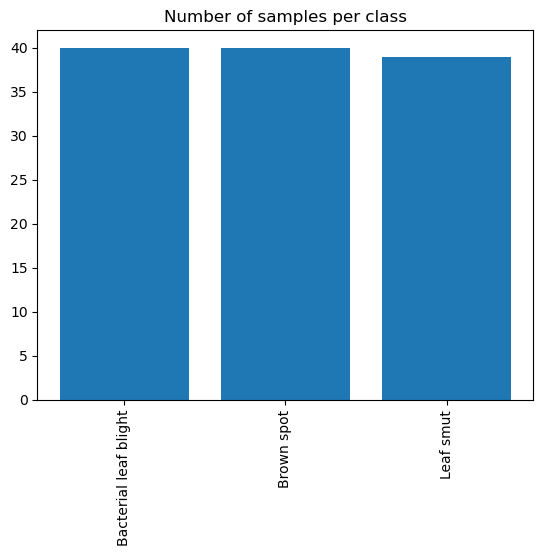

In [106]:
train_img_names = {}
valid_img_names = {}
print(f'Number of classes: {len(CLASSES)}')
counts = {}
img_names = {}
for c in CLASSES:
    img_names = os.listdir(DATA_PATH / c)
    train_img_names[c], valid_img_names[c] = train_test_split(img_names, test_size=0.2, random_state=42)
    counts[c] = len(img_names)
plt.bar(x=counts.keys(), height=counts.values())
plt.xticks(rotation=90)
plt.title('Number of samples per class')
plt.show()

In [107]:
class ClassifyDataset(torch.utils.data.Dataset):
    def __init__(self, data_path, names, classes, img_size, transforms=None):
        super().__init__()
        assert Path(data_path).exists() and Path(data_path).is_dir(), EOFError
        self.data_path = Path(data_path)
        self.classes = classes
        self.img_size = img_size
        if transforms is not None:
            assert callable(transforms), Exception('transforms can not be callable!!!')
        self.transforms = transforms
        
        self.img_names = []
        self.labels = []
        for i, c in enumerate(self.classes):
            self.img_names += names[c]
            self.labels += len(names[c]) * [i]
    
    def __len__(self):
        return len(self.img_names)
    
    def __getitem__(self, index):
        # get label and read image
        label = self.labels[index]
        img_path = self.data_path / self.classes[label] / self.img_names[index]
        
        img = cv2.imread(img_path.as_posix())
        
        # preprocess image
        img = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2RGB)
        img = cv2.resize(src=img, dsize=2 * [self.img_size], interpolation=cv2.INTER_LINEAR)
        img = torch.from_numpy(img).permute(2, 1, 0)
        
        # augmentation
        if self.transforms is not None:
            img = self.transforms(img)
        img = (img / 255).float()
        
        return img, label
    
    def sample(self, num_samples):
        imgs, labels = [], []
        for sample_idx in np.random.choice(a=len(self), size=num_samples):
            img, label = self[sample_idx]
            imgs.append(img)
            labels.append(label)
        return torch.stack(imgs), torch.LongTensor(labels)
            
    def show_samples(self, num_samples=None, figsize=(20, 20)):
        labels = np.array(self.labels)
        uniques = np.unique(ar=labels)
        if num_samples is None:
            num_samples = len(uniques)

        # make image grid
        imgs = []
        for u in uniques:
            sample_idxs = np.random.choice(np.where(labels == u)[0], size=num_samples)
            imgs.append(make_grid([self[idx][0] for idx in sample_idxs], nrow=num_samples))
        imgs = make_grid(imgs, nrow=1)

        # show grid image
        plt.figure(figsize=figsize)
        plt.imshow(imgs.permute(1, 2, 0))

        # set labels for ticks
        grid_size = imgs.shape[1] / num_samples
        ticks = np.linspace(grid_size / 2, imgs.shape[1] - grid_size / 2, len(uniques))
        plt.xticks(ticks=[])
        plt.yticks(ticks=ticks, labels=train_dataset.classes)

        plt.show()

In [108]:
transforms = TT.Compose([
    TT.RandomCrop(size=IMG_SIZE, padding=round(0.2 * IMG_SIZE)),
    TT.RandAugment(num_ops=2, magnitude=9),
    TT.AugMix(severity=3, mixture_width=3)
])
transforms

Compose(
    RandomCrop(size=(224, 224), padding=45)
    RandAugment(num_ops=2, magnitude=9, num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)
    AugMix(severity=3, mixture_width=3, chain_depth=-1, alpha=1.0, all_ops=True, interpolation=InterpolationMode.BILINEAR, fill=None)
)

In [109]:
train_dataset = ClassifyDataset(data_path=DATA_PATH, 
                                names=train_img_names,
                                classes=CLASSES, 
                                img_size=IMG_SIZE, 
                                transforms=transforms)
valid_dataset = ClassifyDataset(data_path=DATA_PATH, 
                                names=valid_img_names,
                                classes=CLASSES, 
                                img_size=IMG_SIZE)
len(train_dataset), len(valid_dataset)

(95, 24)

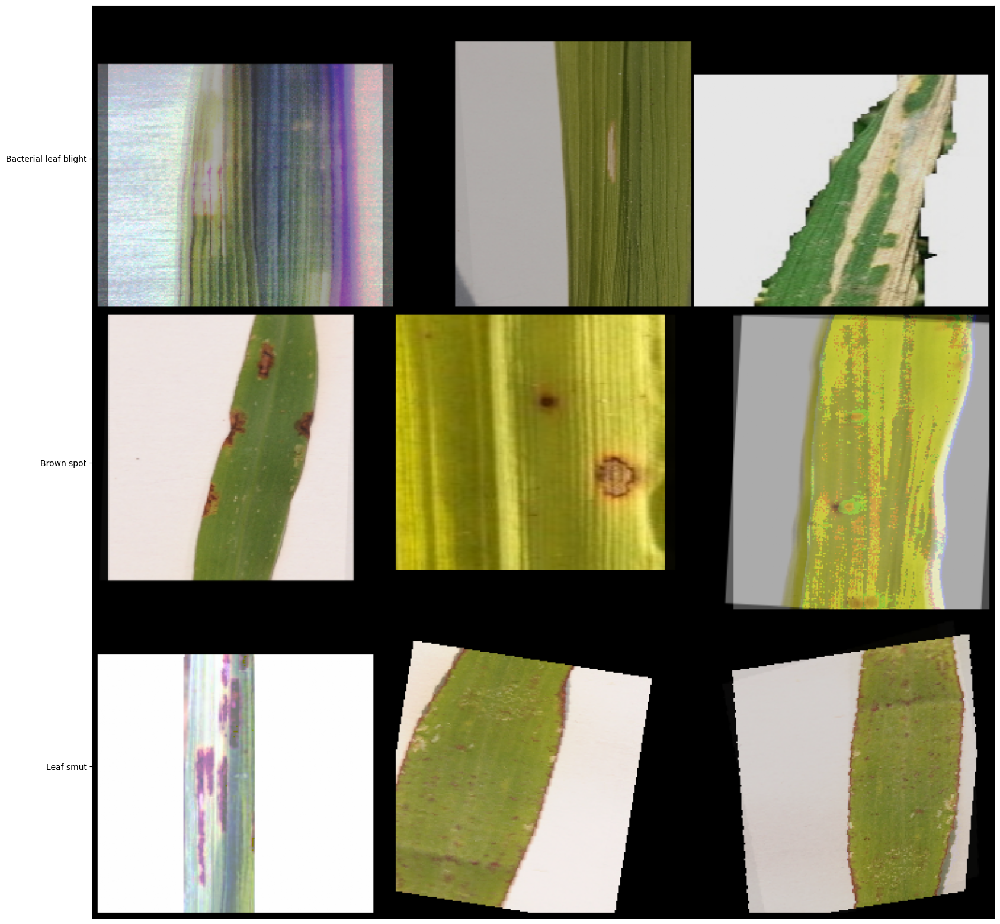

In [110]:
train_dataset.show_samples()

In [111]:
class CrossEntropyLoss(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.loss_fn = torch.nn.CrossEntropyLoss()
    
    def forward(self, preds, targets):
        # compute loss
        loss = self.loss_fn(preds, targets)
        
        # compute metrics
        metrics = {'loss': loss.item()}
        if preds.size() == targets.size():
            targets = targets.argmax(dim=-1)
        preds = preds.argmax(dim=-1)
        metrics['acc'] = torch.mean((preds == targets).float()).item()
        return loss, metrics

In [112]:
def train_model(datasets, model, criterion, optimizer, lr_scheduler, eval_metric, eval_func,
                epochs=10, batch_size=16, max_grad_norm=None, cuda=False, num_workers=8, ckpt_dir=''):
    ckpt_dir = Path(ckpt_dir)
    assert ckpt_dir.exists() and ckpt_dir.is_dir(), EOFError
    assert callable(eval_func), TypeError
    assert len(datasets) == 2, ValueError
    assert isinstance(model, torch.nn.Module), TypeError
    assert isinstance(criterion, torch.nn.Module), TypeError
    if cuda:
        model.cuda()
        criterion.cuda()
    
    # create dataloaders
    train_dataloader = torch.utils.data.DataLoader(dataset=datasets[0], batch_size=batch_size, 
                                                   shuffle=True, drop_last=True,
                                                   num_workers=min(os.cpu_count(), num_workers))
    valid_dataloader = torch.utils.data.DataLoader(dataset=datasets[1], batch_size=2 * batch_size, 
                                                   shuffle=False, num_workers=min(os.cpu_count(), num_workers))

    # logs and evaluate metric
    logs = {
        name: defaultdict(list)
        for name in ['train', 'valid']
    }
    best_eval = 0.0

    # run training process
    for epoch in range(epochs):
        print(20 * '>', f'EPOCH {epoch + 1}', 20 * '<')

        # training
        model.train()
        criterion.train()
        with tqdm(train_dataloader, desc='Train') as pbar:
            avg_metrics = defaultdict(lambda: 0)
            for i, (X, y) in enumerate(pbar):
                # forward
                if cuda:
                    X, y = X.cuda(), y.cuda()
                y_pred = model(X)

                # compute loss and metrics
                loss, metrics = criterion(y_pred, y)

                # backward
                optimizer.zero_grad()
                loss.backward()
                if max_grad_norm is not None:
                    nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
                optimizer.step()

                # compute average metrics and show traning performance
                alpha = 1 / (i + 1)
                for name, value in metrics.items():
                    avg_metrics[name] = (1 - alpha) * avg_metrics[name] + alpha * value
                pbar.set_postfix(avg_metrics)

            # log results
            for name, value in avg_metrics.items():
                logs['train'][name].append(value)

        # validating
        model.eval()
        criterion.eval()
        with tqdm(valid_dataloader, desc='Valid') as pbar:
            avg_metrics = defaultdict(lambda: 0)
            for i, (X, y) in enumerate(pbar):
                # forward
                if cuda:
                    X, y = X.cuda(), y.cuda()
                with torch.no_grad():
                    y_pred = model(X)

                # compute loss and metrics
                loss, metrics = criterion(y_pred, y)

                # compute average metrics and show performance
                alpha = 1 / (i + 1)
                for name, value in metrics.items():
                    avg_metrics[name] = (1 - alpha) * avg_metrics[name] + alpha * value
                pbar.set_postfix(avg_metrics)

            # log results
            for name, value in avg_metrics.items():
                logs['valid'][name].append(value)

        # checkpoint
        if eval_func(best_eval, avg_metrics[eval_metric]):
            best_eval = avg_metrics[eval_metric]
            torch.save(obj=model.state_dict(), f=ckpt_dir / 'best_weights.pt')
            print(20 * '>', f'BEST MODEL SAVED, {eval_metric}: {round(best_eval, 3)}', 20 * '<')
        torch.save(obj=model.state_dict(), f=ckpt_dir / 'last_weights.pt')
        torch.save(obj=logs, f=ckpt_dir / 'train_logs.cache')

        # run scheduler
        lr_scheduler.step()
        print()

In [113]:
# TRAINING CONFIG
EPOCHS = 50
BATCH_SIZE = 32

CUDA = torch.cuda.is_available()
EVAL_METRIC = 'acc'
EVAL_FUNC = lambda old, new: old <= new

LR = 1e-4
WEIGHT_DECAY = 3e-5
DIV_FACTOR = 10
FINAL_DIV_FACTOR = 100
MAX_GRAD_NORM = 2.0

NUM_WORKERS = 8
CKPT_ROOT = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data' # ckpt_root + model_name

In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [6]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten,Dense,Dropout,BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras import regularizers
from tensorflow.keras.optimizers import Adam,RMSprop,SGD,Adamax

In [7]:
dataset= tf.keras.preprocessing.image_dataset_from_directory(
    r"C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data",
    shuffle=True,
    image_size=(150,150),
    batch_size=32
)

Found 119 files belonging to 4 classes.


In [8]:
class_names= dataset.class_names
print(class_names)
len(dataset)

['Bacterial leaf blight', 'Brown spot', 'Leaf smut', 'vgg16']


4

In [9]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 150, 150, 3)
[2 0 1 0 2 2 0 0 1 0 0 1 2 1 0 1 2 0 2 2 0 0 1 1 0 2 2 0 2 1 1 0]


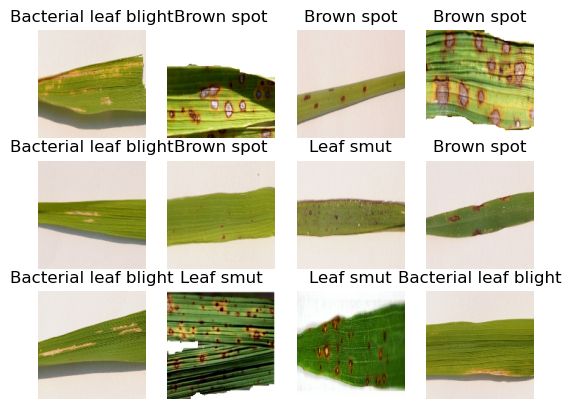

In [10]:
for image_batch, label_batch in dataset.take(1):
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [11]:
len(dataset)

4

In [12]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
base_dir = 'C:/Users/thomb/Desktop/INTERNSHIP/PRCP-1001-RiceLeaf/Data'
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.1,  # reserve 10% of the data for validation
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
# Generate training data
train_generator = datagen.flow_from_directory(
    base_dir,
    target_size=(150, 150),
    color_mode="rgb",
    batch_size=32,
    subset='training',  # set as training data
    class_mode='categorical'
)
validation_generator = datagen.flow_from_directory(
    base_dir,
    target_size=(150, 150),
    color_mode="rgb",
    batch_size=32,
    subset='validation',  # set as validation data
    class_mode='categorical'
)

Found 108 images belonging to 4 classes.
Found 11 images belonging to 4 classes.


In [13]:
from tensorflow.keras.applications import VGG16

In [14]:
conv_base=VGG16(weights='imagenet',
               include_top=False,
               input_shape=(150,150,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 14s 0us/step


In [15]:
model=Sequential()
model.add(conv_base)
model.add(Flatten())
model.add(Dense(256,activation='relu'))
model.add(Dense(4,activation='softmax'))

In [16]:
conv_base.trainable=False

In [19]:
from keras.optimizers import Adam

In [21]:
from keras.optimizers import Adam

model.compile(
    optimizer = Adam(learning_rate=0.001),  # Use 'learning_rate' instead of 'lr'
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


In [22]:
history = model.fit(train_generator, validation_data=validation_generator, epochs=10)

Epoch 1/10


C:\Users\thomb\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4/4 ━━━━━━━━━━━━━━━━━━━━ 29s 5s/step - accuracy: 0.2052 - loss: 2.1593 - val_accuracy: 0.2727 - val_loss: 2.1030
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 5s/step - accuracy: 0.4273 - loss: 1.5641 - val_accuracy: 0.4545 - val_loss: 1.8861
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 6s/step - accuracy: 0.5132 - loss: 1.1663 - val_accuracy: 0.5455 - val_loss: 0.9775
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 6s/step - accuracy: 0.6494 - loss: 1.0072 - val_accuracy: 0.7273 - val_loss: 0.5242
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 5s/step - accuracy: 0.7382 - loss: 0.6198 - val_accuracy: 0.8182 - val_loss: 0.6905
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 23s 5s/step - accuracy: 0.7704 - loss: 0.5599 - val_accuracy: 0.7273 - val_loss: 0.5274
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 24s 5s/step - accuracy: 0.8704 - loss: 0.4214 - val_accuracy: 0.8182 - val_loss: 0.3816
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 5s/step - accuracy: 0.7819 - loss: 0.4961 - val_accuracy: 0.7273 - val_loss: 0.5781
Epoch 9/10
4/4 ━━━━

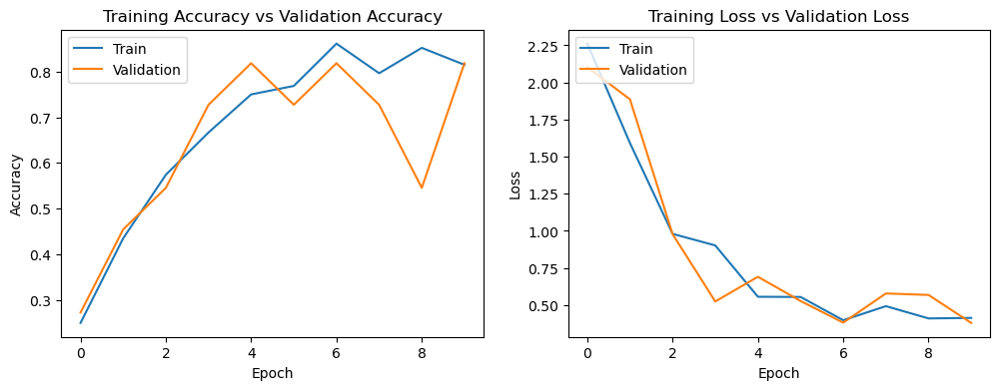

In [23]:
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
fig.set_size_inches(12,4)
ax[0].plot(history.history['accuracy'])
ax[0].plot(history.history['val_accuracy'])
ax[0].set_title('Training Accuracy vs Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'], loc='upper left')
ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Training Loss vs Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [24]:
print("Accuracy of our model on validation data : " , model.evaluate(validation_generator)[1]*100 , "%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.7273 - loss: 0.4098
Accuracy of our model on validation data :  72.72727489471436 %


In [25]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,009,998 (80.15 MB)

 Trainable params: 2,098,436 (8.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 4,196,874 (16.01 MB)

In [28]:
tf.keras.utils.plot_model(model, to_file = "model.png", show_shapes = True, show_dtype = True)

You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


In [30]:
import numpy as np

def extract_data(generator):
    data_list = []
    labels_list = []
    for _ in range(len(generator)):  # Use len() instead of generator.__len__()
        data, labels = next(generator)  # Use the next() function instead of generator.next()
        data_list.append(data)
        labels_list.append(labels)
    x = np.vstack(data_list)
    y = np.vstack(labels_list)
    return x, y

# Assuming train_generator and validation_generator are valid DirectoryIterators
x_train, y_train = extract_data(train_generator)
x_test, y_test = extract_data(validation_generator)


In [31]:
loss = model.evaluate(x_test,y_test) 
print("Test Acc: " + str(loss[1]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.9091 - loss: 0.4066
Test Acc: 0.9090909361839294


In [32]:
preds = model.predict(x_test)
y_pred = np.argmax(preds , axis = 1 )

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


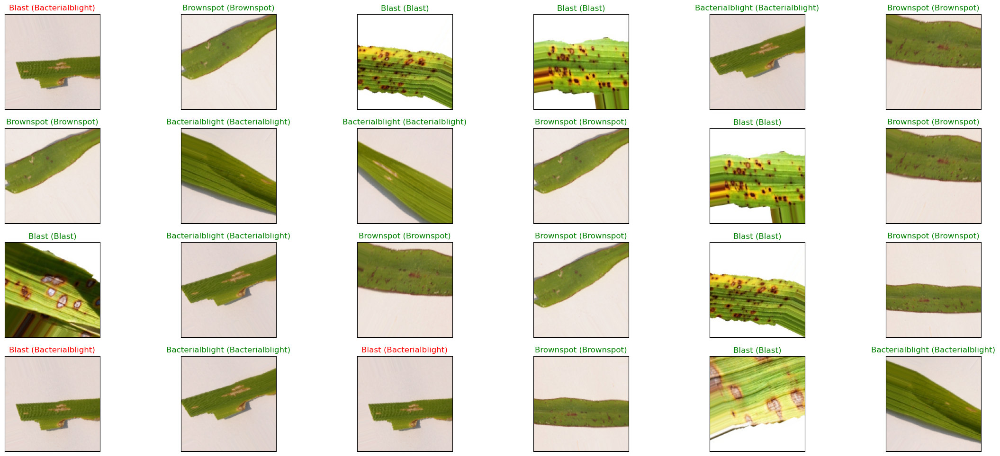

In [33]:
label_dict = {0 : 'Bacterialblight', 1 : 'Blast', 2 : 'Brownspot', 3 : 'Tungro'}

figure = plt.figure(figsize=(28, 12))
for i, index in enumerate(np.random.choice(x_test.shape[0], size=24)):
    ax = figure.add_subplot(4, 6, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(x_test[index]))
    predict_index = label_dict[(y_pred[index])]
    true_index = label_dict[np.argmax(y_test,axis=1)[index]]
    
    ax.set_title("{} ({})".format((predict_index), 
                                  (true_index)),
                                  color=("green" if predict_index == true_index else "red"))

In [34]:
y_true = np.argmax(y_test, axis=1)

In [35]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_true, y_pred)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.75      0.86         4
           1       0.80      1.00      0.89         4
           2       1.00      1.00      1.00         3

    accuracy                           0.91        11
   macro avg       0.93      0.92      0.92        11
weighted avg       0.93      0.91      0.91        11



# Conclusion 

In this project, we successfully developed a Convolutional Neural Network (CNN) model to predict rice leaf diseases based on image data. The model achieved an accuracy of 91%, demonstrating its effectiveness in identifying diseases from rice leaf images. This result shows that CNN can be a powerful tool for agricultural disease detection, providing farmers with timely and accurate diagnostics. However, further improvements can be made by expanding the dataset, tuning hyperparameters, and exploring more advanced architectures to push the accuracy closer to 100%. The model holds promise for real-world applications, potentially contributing to better crop health management.

The CNN model effectively learned to differentiate between various rice leaf diseases based on visual patterns, affirming the strength of deep learning techniques in handling image-based datasets.
The project utilized a dataset consisting solely of rice leaf images, which provided a real-world representation of the input data that agricultural professionals would encounter.
The 91% accuracy achieved highlights the robustness of the model, though it also reveals potential areas for further optimization and refinement.

### Challenges and Limitations

Future Work: To build upon the results of this project, the following improvements can be considered:

1. Dataset Augmentation: Expanding the dataset by collecting more varied and high-quality images across different regions and conditions can help the model generalize better.
2. Model Optimization: Experimenting with deeper network architectures or pre-trained models such as ResNet or EfficientNet may yield improved results.
3. Real-time Implementation: Deploying the model into a mobile or cloud-based application can help provide real-time disease diagnosis to farmers.

This model has the potential to serve as a foundation for precision agriculture tools, helping reduce the reliance on manual disease detection and allowing for faster, data-driven decision-making. With further development, the solution could have a significant impact on rice production, potentially improving food security and crop management.

### Future Enhancements

Dataset Expansion: Collect more diverse images across regions and seasons to improve generalization.

Advanced Models: Explore transfer learning with pre-trained models (ResNet, EfficientNet) and incorporate attention mechanisms for better feature extraction.

Real-time Deployment: Develop mobile or cloud-based applications for real-time disease detection, enabling farmers to upload images for instant feedback.

Severity Estimation: Add functionality to predict disease severity and progression for more detailed insights.

Explainability: Implement Explainable AI techniques (e.g., Grad-CAM) to visualize which parts of the leaf the model is focusing on for predictions.